In [1]:
import gc
import pickle as pkl
import numpy as np
import matplotlib.pyplot as plt
import glob
import PyDSTool as dst

# Glutamate Traces

In [2]:
## Files
nostim_traces_glu = pkl.load(open('MOTIF2/glutamate_params_no_stim_traces_2.pkl', 'rb'))
acstim_traces_glu_bn = pkl.load(open('MOTIF2/glutamate_params_bn_acstim_traces_2.pkl', 'rb'))
acstim_traces_glu_inh = pkl.load(open('MOTIF2/glutamate_params_inh_acstim_traces_2.pkl', 'rb'))
dbsstim_traces_glu_bn = pkl.load(open('MOTIF2/glutamate_params_bn_dbsstim_traces_2.pkl', 'rb'))
dbsstim_traces_glu_inh = pkl.load(open('MOTIF2/glutamate_params_inh_dbsstim_traces_2.pkl', 'rb'))


## No stimulation

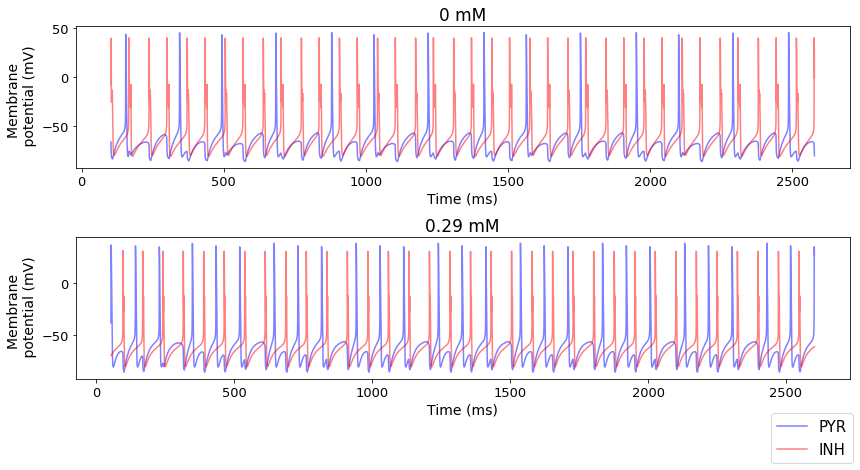

In [3]:
gvals_paper = [0, 0.29]
upper_limit = [29000,  27000]
fig, axes = plt.subplots(2,1, figsize=(12, 6))
for g,ul, ax in zip(gvals_paper,upper_limit, axes):
    ode, traj, pts = nostim_traces_glu[g]
    ax.plot(pts['t'][1000:ul], pts['Vs'][1000:ul], color='blue', alpha = 0.5, label = 'PYR')
    ax.plot(pts['t'][1000:ul], pts['Vpost'][1000:ul], color = 'red', alpha=0.5, label='INH')
    
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane \n potential (mV)', fontsize=14)
    ax.set_xlabel('Time (ms)', fontsize=14)
    ax.set_title('{} mM'.format(g), fontsize=17)
    
plt.tight_layout()
for ax in axes.flat:
    h, l = ax.get_legend_handles_labels()
fig.legend(h,l, bbox_to_anchor=(1.0, 0.05), fontsize=15)
plt.savefig('Results/motif2_glutamate_traces_appendix_nostim.pdf',  bbox_inches='tight')
plt.savefig('Results/motif2_glutamate_traces_appendix_nostim.png',  bbox_inches='tight')



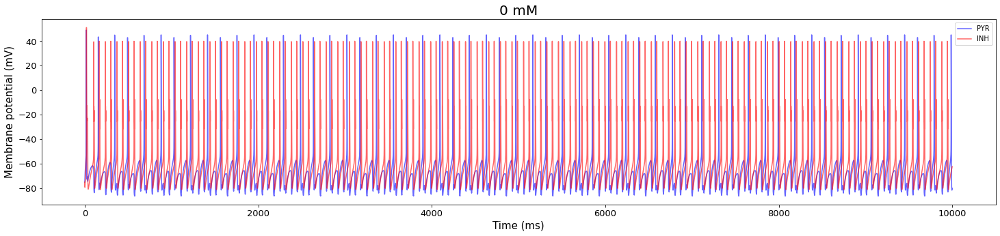

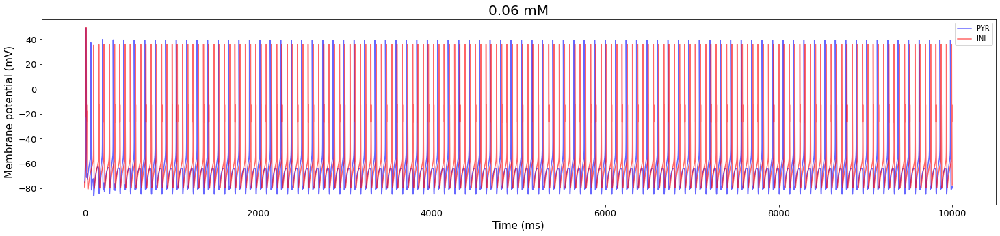

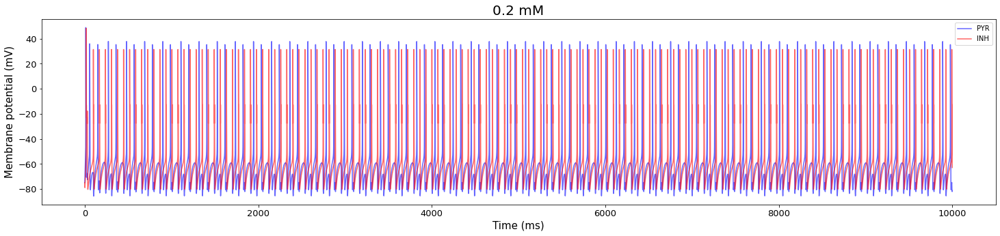

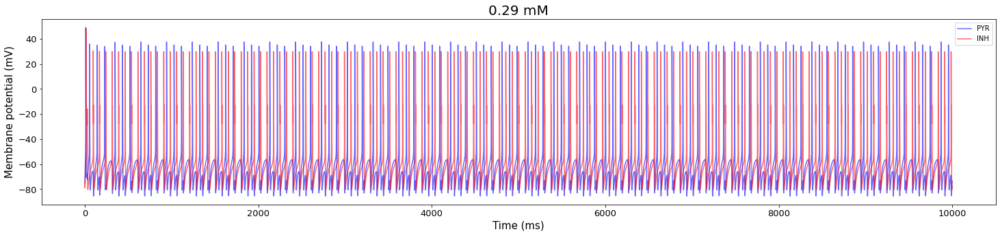

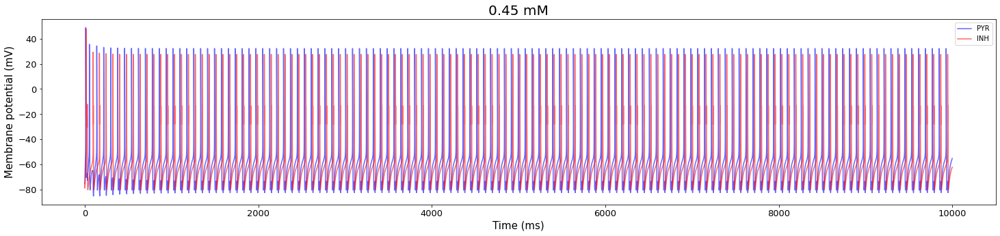

In [4]:
for g in nostim_traces_glu.keys():
    fig, ax = plt.subplots(figsize=(25, 5))
    ode, traj, pts = nostim_traces_glu[g]
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} mM'.format(g), fontsize=20)
    plt.savefig('motif2_glutamate{}_traces_nostim.pdf'.format(g))

## Stimulation

In [5]:
print(acstim_traces_glu_bn.keys())
print(acstim_traces_glu_bn[0.06].keys())
print(acstim_traces_glu_bn[0.29].keys())
print(acstim_traces_glu_bn[0.45].keys())
print('--------------------------------------------------------------')
print(acstim_traces_glu_inh.keys())
print(acstim_traces_glu_inh[0.06].keys())
print(acstim_traces_glu_inh[0.29].keys())
print('--------------------------------------------------------------')
print(dbsstim_traces_glu_bn.keys())
print(dbsstim_traces_glu_bn[0.29].keys())
print(dbsstim_traces_glu_bn[0.45].keys())
print('--------------------------------------------------------------')
print(dbsstim_traces_glu_inh.keys())
print(dbsstim_traces_glu_inh[0.06].keys())
print(dbsstim_traces_glu_inh[0.29].keys())

dict_keys([0.06, 0.29, 0.45])
dict_keys([(60, 5.5)])
dict_keys([(25, 4.5), (25, 2.5), (50, 4.5)])
dict_keys([(25, 1.5), (30, 2.5)])
--------------------------------------------------------------
dict_keys([0.06, 0.29])
dict_keys([(30, 2.5)])
dict_keys([(25, 4.5), (25, 2.5), (50, 4.5)])
--------------------------------------------------------------
dict_keys([0.29, 0.45])
dict_keys([(75, 9.5), (60, 9.5)])
dict_keys([(100, 4.5), (75, 5.5)])
--------------------------------------------------------------
dict_keys([0.06, 0.29])
dict_keys([(50, 5.5)])
dict_keys([(100, 4.5), (75, 5.5)])


### AC stim BN @ 0.06 mM

(60, 5.5)


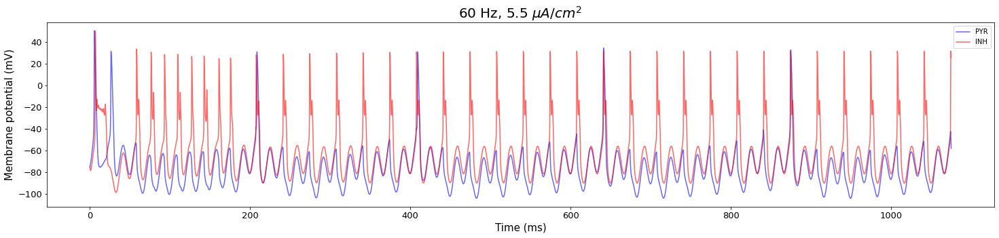

In [6]:
for key, val in acstim_traces_glu_bn[0.06].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'][0:20000], pts['Vs'][0:20000], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'][0:20000], pts['Vpost'][0:20000], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_glutamate0.06_traces_bn_acstim{}_{}.pdf'.format(key[0], key[1]))

### AC stim BN @ 0.29mM

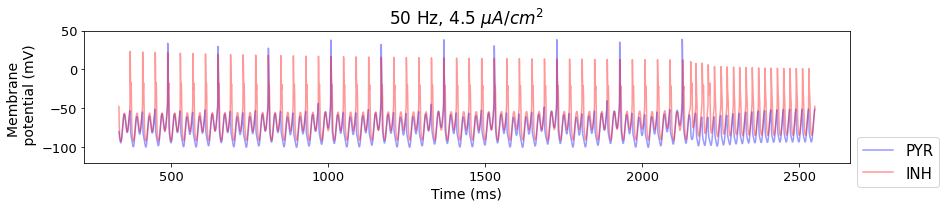

In [7]:
upper_limit = [39000]
fig, ax = plt.subplots(1,1, figsize=(12, 3))
acstim_vals = [(key, val) for key, val in acstim_traces_glu_bn[0.29].items() if key == (50, 4.5)]
for stim, ul in zip(acstim_vals, upper_limit):
    ode, traj, pts = stim[1]
    ax.plot(pts['t'][5500:ul], pts['Vs'][5500:ul], color='blue', alpha = 0.4, label = 'PYR')
    ax.plot(pts['t'][5500:ul], pts['Vpost'][5500:ul], color = 'red', alpha=0.4, label='INH')
    
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane \n potential (mV)', fontsize=14)
    ax.set_xlabel('Time (ms)', fontsize=14)
    ax.set_title('{} Hz, {} $\mu A/cm^2$'.format(stim[0][0], stim[0][1]), fontsize=17)
    
plt.tight_layout()
#for ax in axes.flat:
    #h, l = ax.get_legend_handles_labels()
#fig.legend(h,l, bbox_to_anchor=(1.0, 0.05), fontsize=15)
plt.legend(bbox_to_anchor=(1.0, 0.25), fontsize=15)
plt.ylim(-120,50)
plt.savefig('Results/motif2_glutamate_traces_appendix_acstim_stim_analysis_plots_bn0.29.pdf',  bbox_inches='tight')
plt.savefig('Results/motif2_glutamate_traces_appendix_acstim_stim_analysis_plots_bn0.29.png',  bbox_inches='tight')


(25, 4.5)
(25, 2.5)
(50, 4.5)


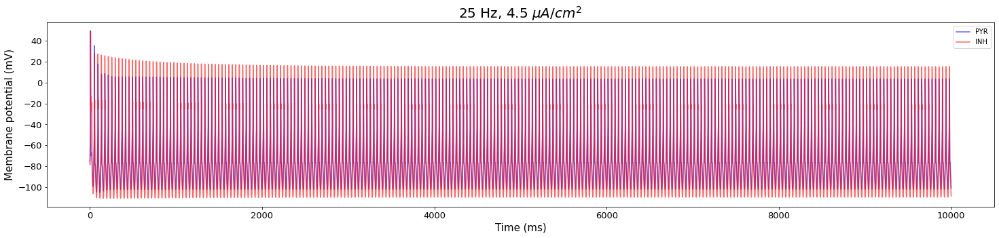

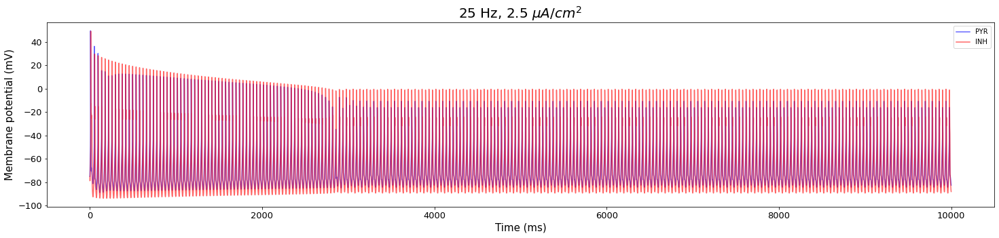

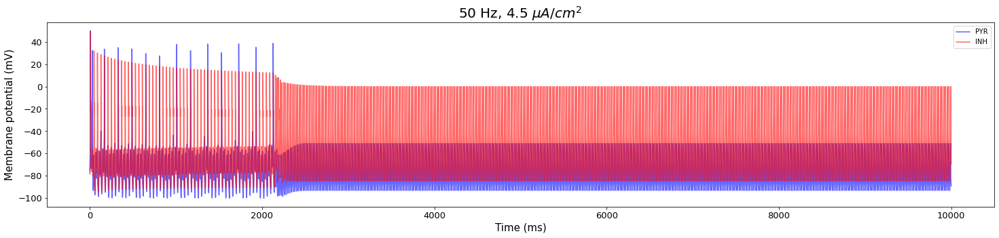

In [8]:
for key, val in acstim_traces_glu_bn[0.29].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_glutamate0.29_traces_bn_acstim{}_{}.pdf'.format(key[0], key[1]))

### AC stim BN @ 0.45 mM

(25, 1.5)
(30, 2.5)


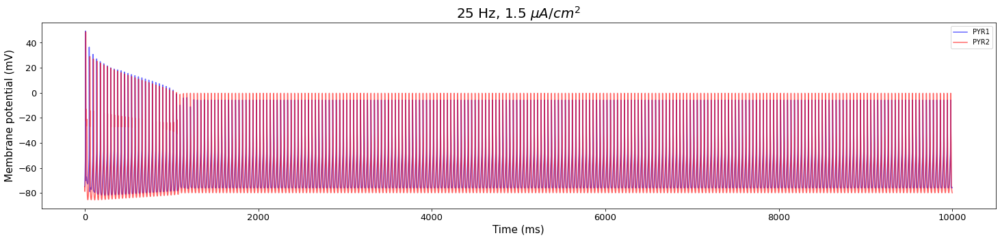

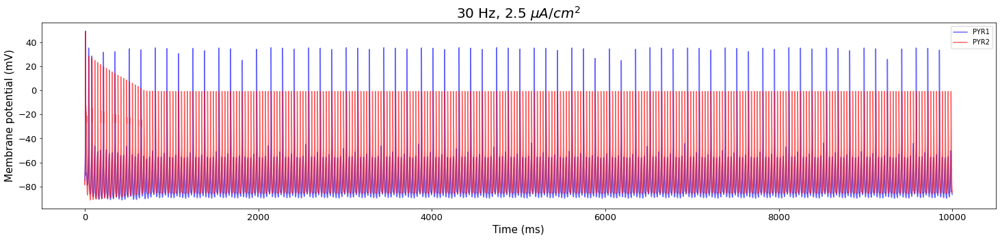

In [10]:
for key, val in acstim_traces_glu_bn[0.45].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR1')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='PYR2')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_glutamate0.45_traces_bn_acstim{}_{}.pdf'.format(key[0], key[1]))

Text(0, 0.5, '$I_{ext}$  ($\\mu A/cm^2$)')

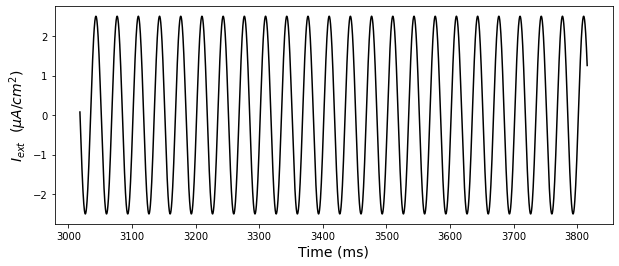

In [11]:
#Plotting AC stim
plt.figure(figsize=(10,4))
iext = [ode.auxfns.Iext(t) for t in pts['t']]
plt.plot(pts['t'][40000:50000], iext[40000:50000], color='k')
plt.xlabel('Time (ms)', fontsize=14)
plt.ylabel('$I_{ext}$' + '  ($\mu A/cm^2$)', fontsize=14)

### AC stim INH @ 0.06 mM

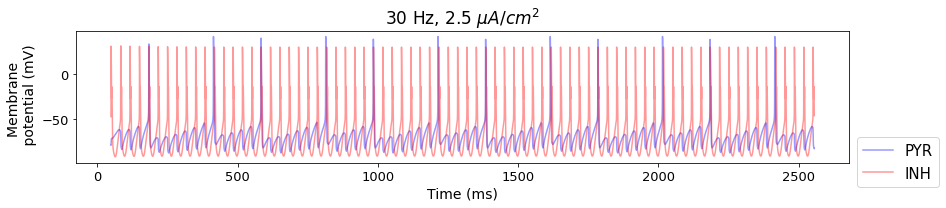

In [12]:
upper_limit = [39000]
fig, ax = plt.subplots(1,1, figsize=(12, 3))
acstim_vals = [(key, val) for key, val in acstim_traces_glu_inh[0.06].items()]
for stim, ul in zip(acstim_vals, upper_limit):
    ode, traj, pts = stim[1]
    ax.plot(pts['t'][1000:ul], pts['Vs'][1000:ul], color='blue', alpha = 0.4, label = 'PYR')
    ax.plot(pts['t'][1000:ul], pts['Vpost'][1000:ul], color = 'red', alpha=0.4, label='INH')
    
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane \n potential (mV)', fontsize=14)
    ax.set_xlabel('Time (ms)', fontsize=14)
    ax.set_title('{} Hz, {} $\mu A/cm^2$'.format(stim[0][0], stim[0][1]), fontsize=17)
    
plt.tight_layout()
#for ax in axes.flat:
    #h, l = ax.get_legend_handles_labels()
#fig.legend(h,l, bbox_to_anchor=(1.0, 0.05), fontsize=15)
plt.legend(bbox_to_anchor=(1.0, 0.25), fontsize=15)
plt.savefig('Results/motif2_glutamate_traces_appendix_acstim_stim_analysis_plots_inh0.6.pdf',  bbox_inches='tight')
plt.savefig('Results/motif2_glutamate_traces_appendix_acstim_stim_analysis_plots_inh0.6.png',  bbox_inches='tight')


(30, 2.5)


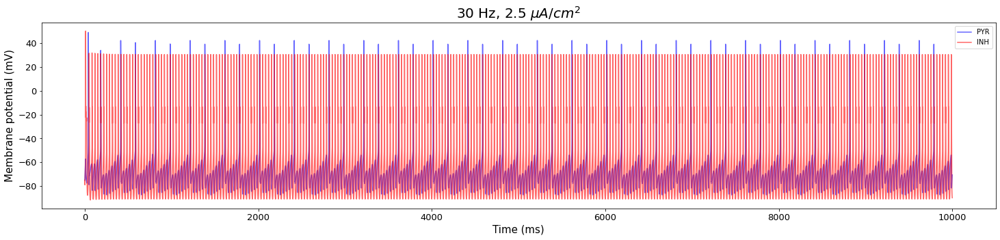

In [13]:
for key, val in acstim_traces_glu_inh[0.06].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_glutamate0.06_traces_inh_acstim{}_{}.pdf'.format(key[0], key[1]))

### AC stim INH @ 0.29mM

(25, 4.5)
(25, 2.5)
(50, 4.5)


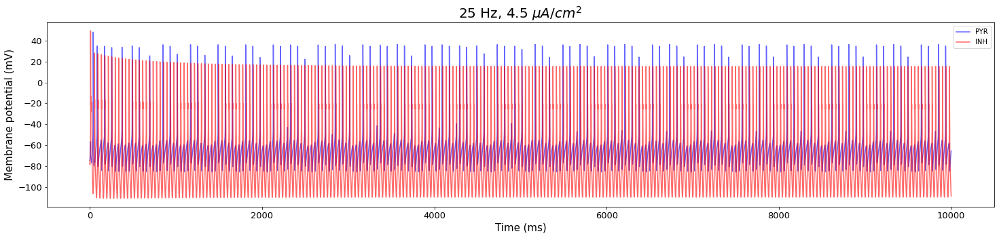

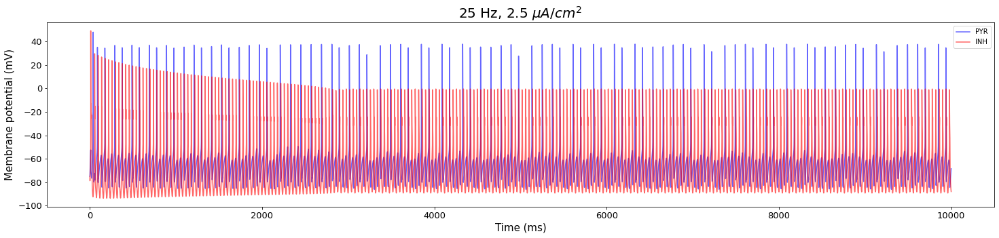

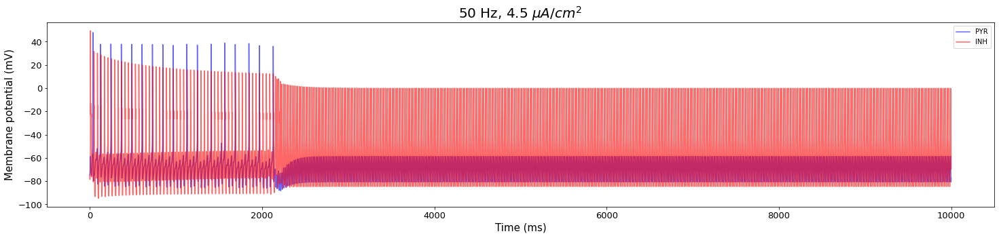

In [14]:
for key, val in acstim_traces_glu_inh[0.29].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_glutamate0.29_traces_inh_acstim{}_{}.pdf'.format(key[0], key[1]))

### DBS stim BN @ 0.29 mM

(75, 9.5)
(60, 9.5)


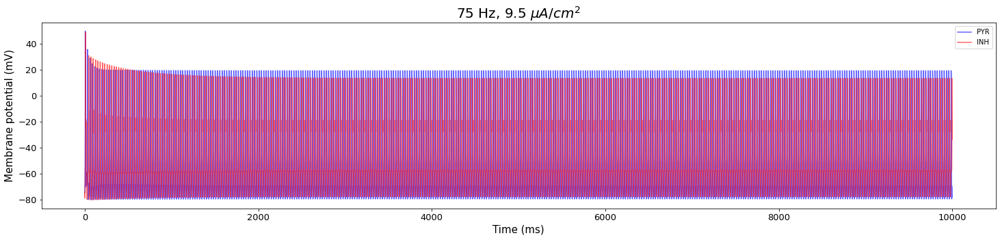

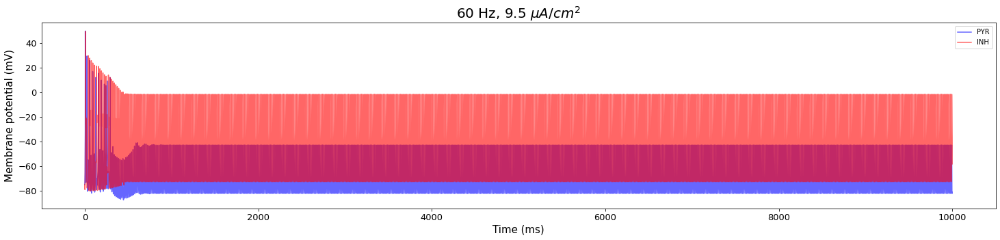

In [15]:
for key, val in dbsstim_traces_glu_bn[0.29].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_glutamate0.29_traces_bn_dbsstim{}_{}.pdf'.format(key[0], key[1]))

Text(0, 0.5, '$I_{ext}$  ($\\mu A/cm^2$)')

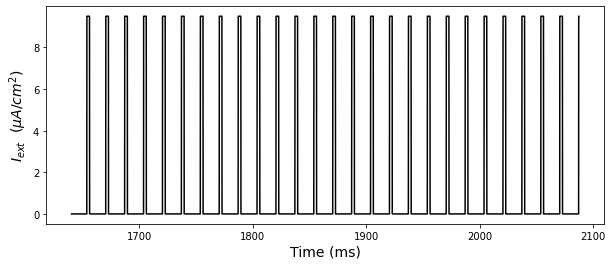

In [29]:
#Plotting DBS stim
plt.figure(figsize=(10,4))
iext = [ode.auxfns.Iext(t) for t in pts['t']]
plt.plot(pts['t'][40000:50000], iext[40000:50000], color='k')
plt.xlabel('Time (ms)', fontsize=14)
plt.ylabel('$I_{ext}$' + '  ($\mu A/cm^2$)', fontsize=14)

### DBS stim BN @ 0.45 mM

(100, 4.5)
(75, 5.5)


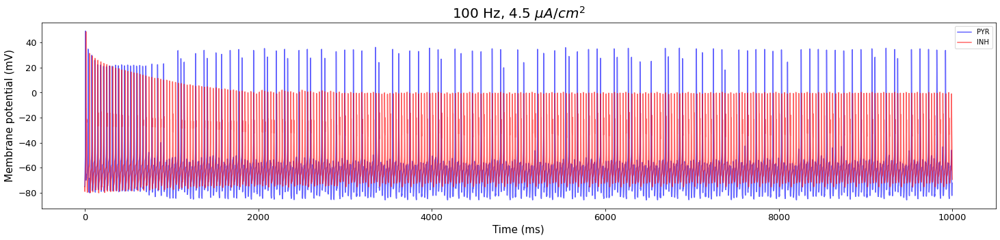

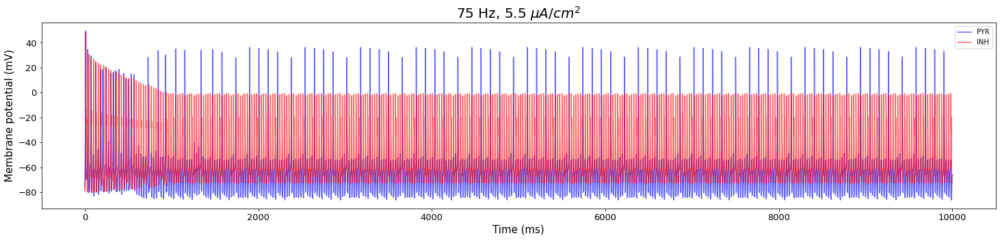

In [16]:
for key, val in dbsstim_traces_glu_bn[0.45].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_glutamate0.45_traces_bn_dbsstim{}_{}.pdf'.format(key[0], key[1]))

### DBS stim INH @ 0.06 mM

(50, 5.5)


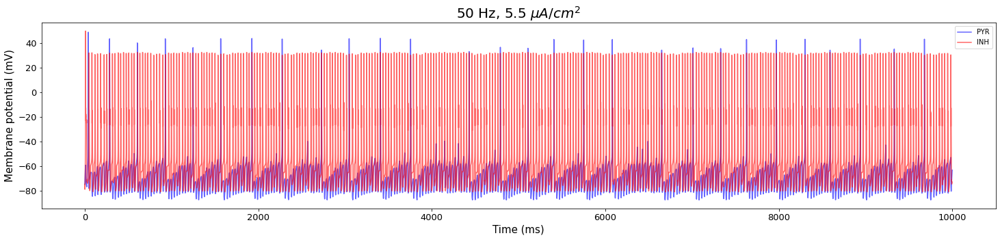

In [17]:
for key, val in dbsstim_traces_glu_inh[0.06].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_glutamate0.06_traces_inh_dbsstim{}_{}.pdf'.format(key[0], key[1]))

### DBS stim INH @ 0.45 mM

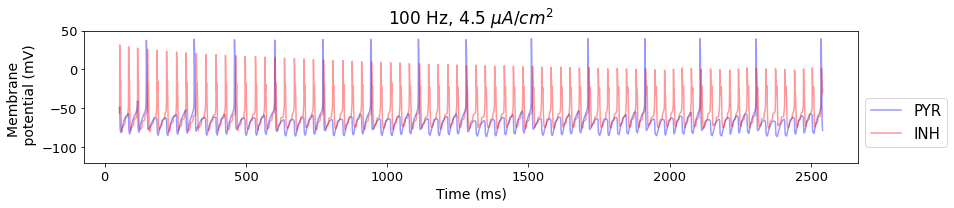

In [18]:
upper_limit = [45000]
fig, ax = plt.subplots(1,1, figsize=(12, 3))
acstim_vals = [(key, val) for key, val in dbsstim_traces_glu_inh[0.29].items() if key == (100, 4.5)]
for stim, ul in zip(acstim_vals, upper_limit):
    pts = stim[1].copy()
    ax.plot(pts['t'][1000:ul], pts['Vs'][1000:ul], color='blue', alpha = 0.4, label = 'PYR')
    ax.plot(pts['t'][1000:ul], pts['Vpost'][1000:ul], color = 'red', alpha=0.4, label='INH')
    
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane \n potential (mV)', fontsize=14)
    ax.set_xlabel('Time (ms)', fontsize=14)
    ax.set_title('{} Hz, {} $\mu A/cm^2$'.format(stim[0][0], stim[0][1]), fontsize=17)
    
plt.tight_layout()
#for ax in axes.flat:
    #h, l = ax.get_legend_handles_labels()
#fig.legend(h,l, bbox_to_anchor=(1.0, 0.05), fontsize=15)
plt.legend(bbox_to_anchor=(1.0, 0.55), fontsize=15)
plt.ylim(-120,50)
plt.savefig('Results/motif2_glutamate_traces_appendix_dbsstim_stim_analysis_plots_inh0.45.pdf',  bbox_inches='tight')
plt.savefig('Results/motif2_glutamate_traces_appendix_dbsstim_stim_analysis_plots_inh0.45.png',  bbox_inches='tight')


(100, 4.5)
(75, 5.5)


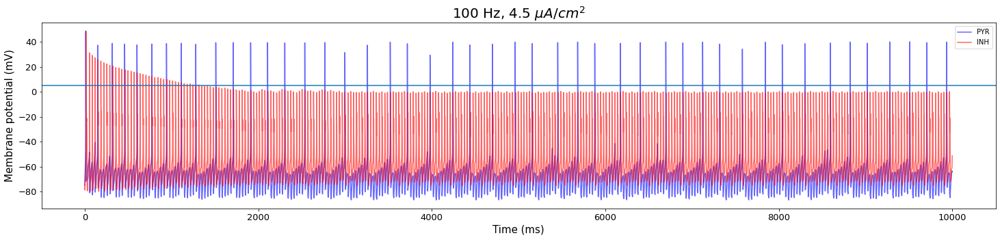

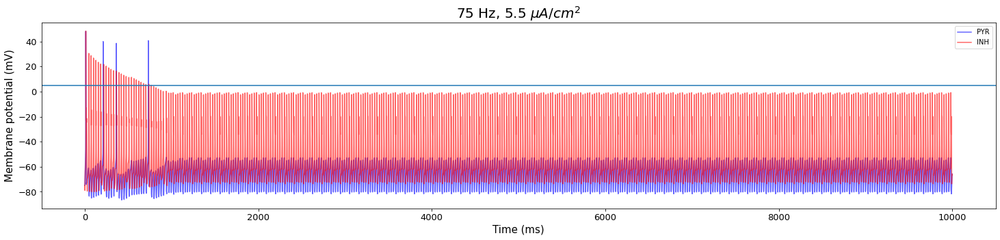

In [19]:
for key, val in dbsstim_traces_glu_inh[0.29].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    #ode, traj, pts = val
    pts = val.copy()
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_glutamate0.29_traces_inh_dbsstim{}_{}.pdf'.format(key[0], key[1]))
    plt.axhline(y=5)

# Ko_rest Traces

In [20]:
## Files
nostim_traces_ko = pkl.load(open('MOTIF2/Ko_params_no_stim_traces_1.pkl', 'rb'))
acstim_traces_ko_bn = pkl.load(open('MOTIF2/Ko_params_bn_acstim_traces_1.pkl', 'rb'))
acstim_traces_ko_inh = pkl.load(open('MOTIF2/Ko_params_inh_acstim_traces_1.pkl', 'rb'))
dbsstim_traces_ko_inh = pkl.load(open('MOTIF2/Ko_params_inh_dbsstim_traces_1.pkl', 'rb'))


## No stimulation

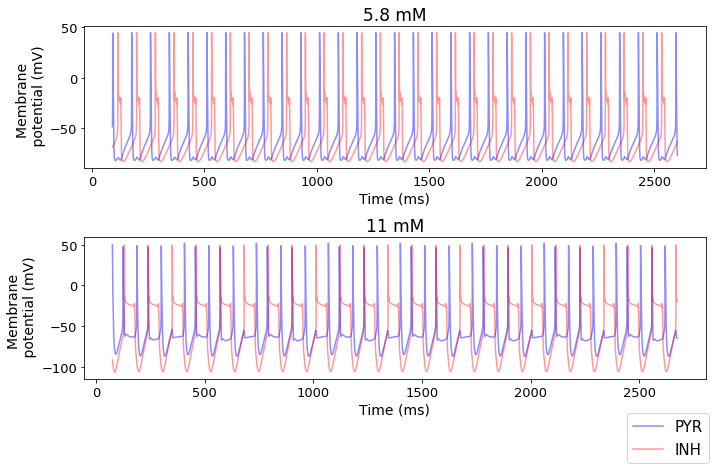

In [21]:
vals_paper = [5.8,11]
upper_limit = [32000, 29000]
fig, axes = plt.subplots(2,1, figsize=(10, 6))
for g,ul, ax in zip(vals_paper,upper_limit, axes):
    ode, traj, pts = nostim_traces_ko[g]
    ax.plot(pts['t'][1000:ul], pts['Vs'][1000:ul], color='blue', alpha = 0.45, label = 'PYR')
    ax.plot(pts['t'][1000:ul], pts['Vpost'][1000:ul], color = 'red', alpha=0.4, label='INH')
    
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane \n potential (mV)', fontsize=14)
    ax.set_xlabel('Time (ms)', fontsize=14)
    ax.set_title('{} mM'.format(g), fontsize=17)
    
plt.tight_layout()
for ax in axes.flat:
    h, l = ax.get_legend_handles_labels()
fig.legend(h,l, bbox_to_anchor=(1.0, 0.05), fontsize=15)
plt.savefig('Results/motif2_ko_traces_appendix_nostim.pdf',  bbox_inches='tight')
plt.savefig('Results/motif2_ko_traces_appendix_nostim.png',  bbox_inches='tight')



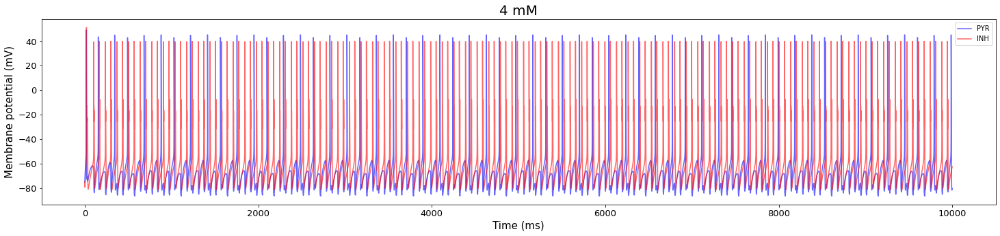

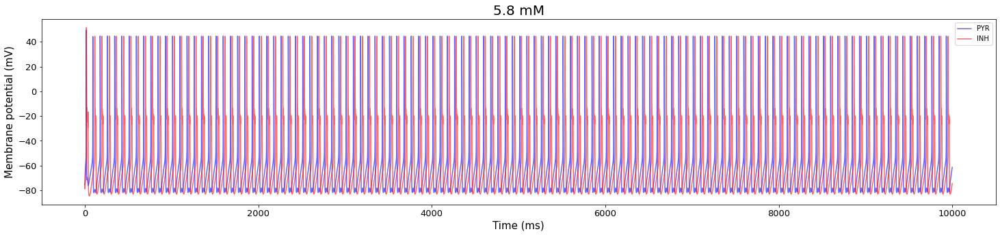

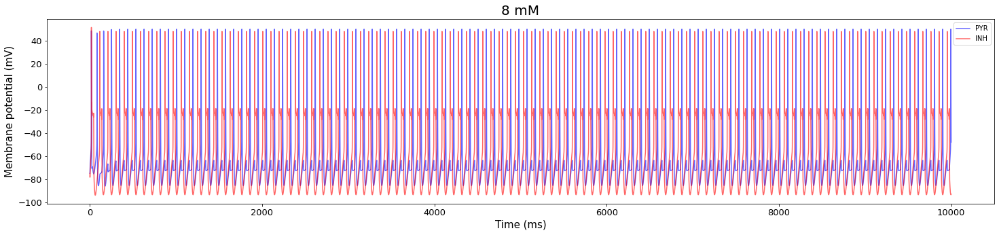

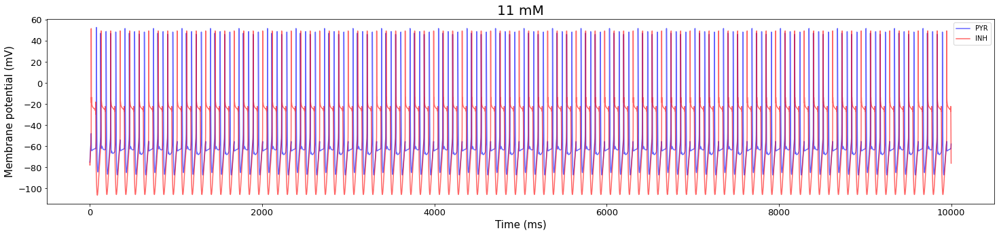

In [22]:
for k in nostim_traces_ko.keys():
    fig, ax = plt.subplots(figsize=(25, 5))
    ode, traj, pts = nostim_traces_ko[k]
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} mM'.format(k), fontsize=20)
    plt.savefig('Results/motif2_Ko{}_traces_nostim.pdf'.format(k))

## Stimulation

In [23]:
print(acstim_traces_ko_bn.keys())
print(acstim_traces_ko_bn[5.8].keys())
print(acstim_traces_ko_bn[8].keys())
print('--------------------------------------------------------------')
print(acstim_traces_ko_inh.keys())
print(acstim_traces_ko_inh[5.8].keys())
print(acstim_traces_ko_inh[8].keys())
print(acstim_traces_ko_inh[11].keys())
print('--------------------------------------------------------------')
print(dbsstim_traces_ko_inh.keys())
print(dbsstim_traces_ko_inh[5.8].keys())
print(dbsstim_traces_ko_inh[8].keys())
print(dbsstim_traces_ko_inh[11].keys())


dict_keys([5.8, 8])
dict_keys([(1, 7.5), (5, 2.5)])
dict_keys([(15, 2.5)])
--------------------------------------------------------------
dict_keys([5.8, 8, 11])
dict_keys([(5, 2.5)])
dict_keys([(15, 2.5)])
dict_keys([(60, 2.5)])
--------------------------------------------------------------
dict_keys([11, 8, 5.8])
dict_keys([])
dict_keys([])
dict_keys([(5, 2.5)])


### AC stim BN @ 5.8 mM

(1, 7.5)
(5, 2.5)


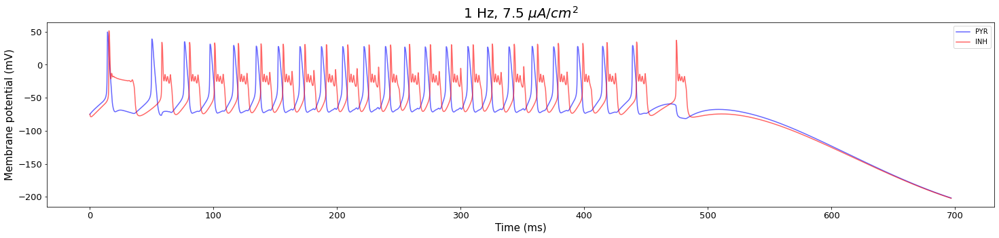

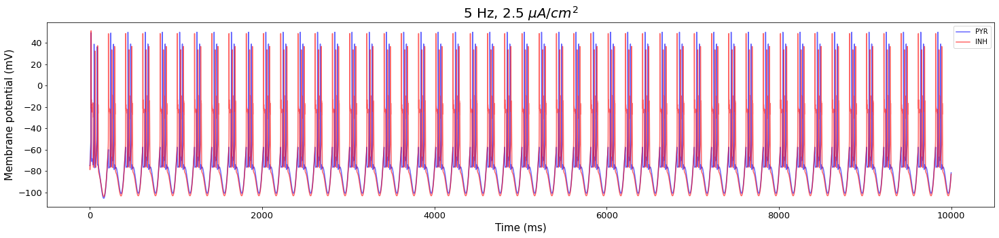

In [24]:
for key, val in acstim_traces_ko_bn[5.8].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_Ko5.8_traces_bn_acstim{}_{}.pdf'.format(key[0], key[1]))

### AC stim BN @ 8 mM

(15, 2.5)


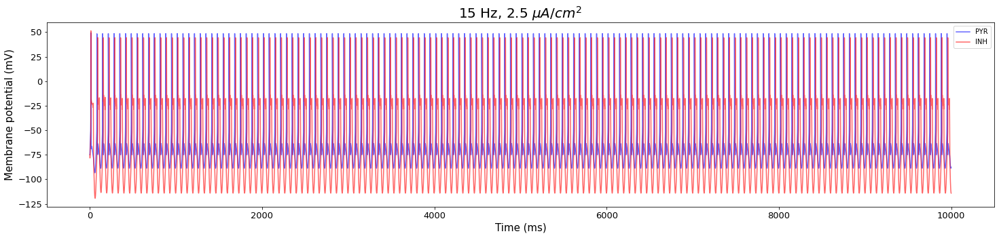

In [25]:
for key, val in acstim_traces_ko_bn[8].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_Ko8_traces_bn_acstim{}_{}.pdf'.format(key[0], key[1]))

### AC stim INH @ 5.8mM

(5, 2.5)


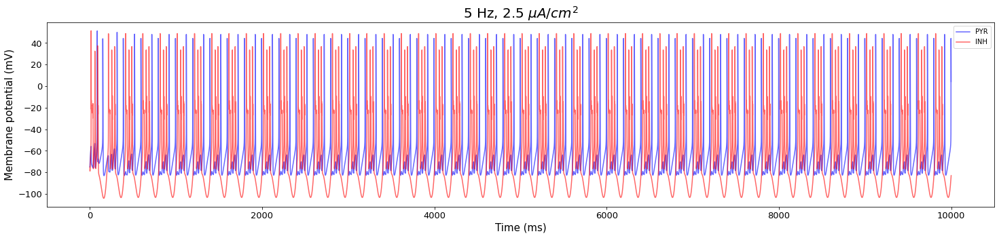

In [26]:
for key, val in acstim_traces_ko_inh[5.8].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_Ko5.8_traces_inh_acstim{}_{}.pdf'.format(key[0], key[1]))

### AC stim INH @ 8mM

(15, 2.5)


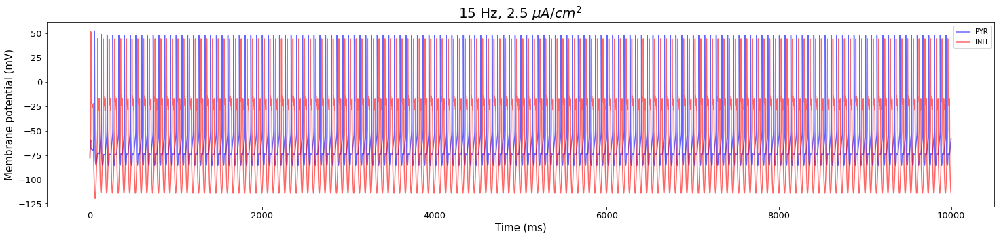

In [27]:
for key, val in acstim_traces_ko_inh[8].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_Ko8_traces_inh_acstim{}_{}.pdf'.format(key[0], key[1]))

### AC stim INH @ 11 mM

(60, 2.5)


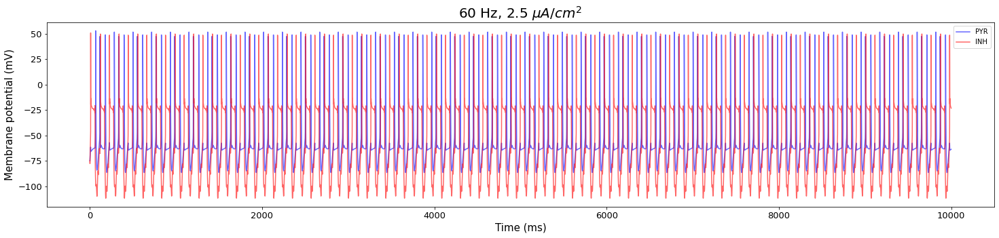

In [28]:
for key, val in acstim_traces_ko_inh[11].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_Ko11_traces_inh_acstim{}_{}.pdf'.format(key[0], key[1]))

### DBS stim INH @ 11 mM

(5, 2.5)


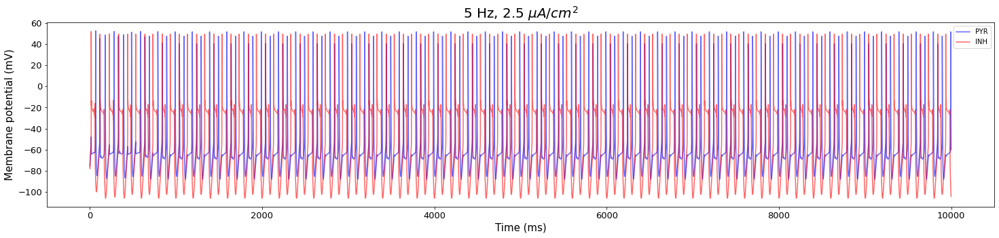

In [29]:
#### Previous and the current are same. One of them is overwritten or something. Check it out! Dont look at this! Wrong figure. Overwritten.
for key, val in dbsstim_traces_ko_inh[11].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_Ko11_traces_inh_dbsstim{}_{}.pdf'.format(key[0], key[1]))

# ATP Traces

## No stimulation

In [30]:
## Files
nostim_traces_atp = pkl.load(open('MOTIF2/atp_params_no_stim_traces_1.pkl', 'rb'))
acstim_traces_atp_bn = pkl.load(open('MOTIF2/atp_params_bn_acstim_traces_1.pkl', 'rb'))
acstim_traces_atp_inh = pkl.load(open('MOTIF2/atp_params_inh_acstim_traces_1.pkl', 'rb'))
acstim_traces_atp_pyr = pkl.load(open('MOTIF2/atp_params_pyr_acstim_traces_1.pkl', 'rb'))
dbsstim_traces_atp_bn = pkl.load(open('MOTIF2/atp_params_bn_dbsstim_traces_1.pkl', 'rb'))
dbsstim_traces_atp_inh = pkl.load(open('MOTIF2/atp_params_inh_dbsstim_traces_1.pkl', 'rb'))
dbsstim_traces_atp_pyr = pkl.load(open('MOTIF2/atp_params_pyr_dbsstim_traces_1.pkl', 'rb'))

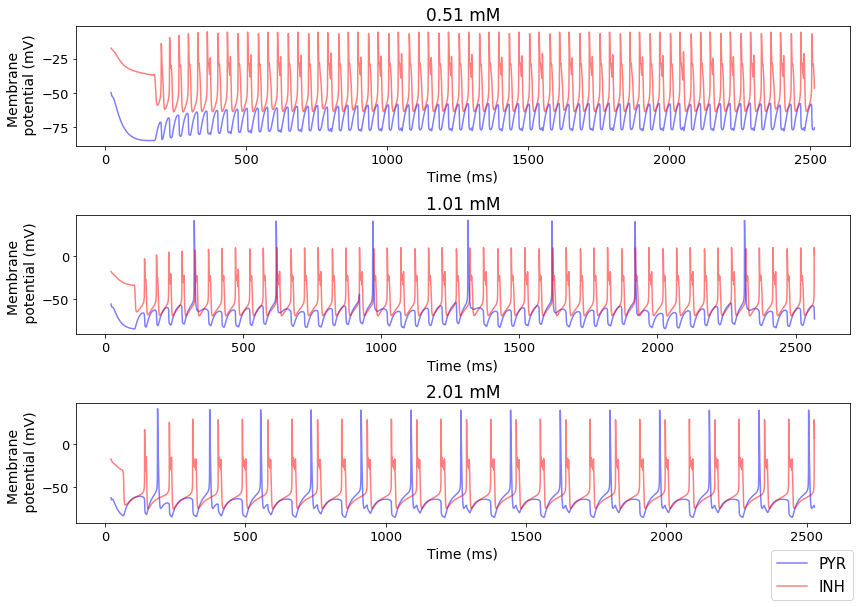

In [31]:
vals_paper = [0.51,1.01, 2.01]
upper_limit = [27000, 27000, 25000]
fig, axes = plt.subplots(3,1, figsize=(12, 8))
for g,ul, ax in zip(vals_paper, upper_limit, axes):
    ode, traj, pts = nostim_traces_atp[g]
    ax.plot(pts['t'][500:ul], pts['Vs'][500:ul], color='blue', alpha = 0.5, label = 'PYR')
    ax.plot(pts['t'][500:ul], pts['Vpost'][500:ul], color = 'red', alpha=0.5, label='INH')
    
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane \n potential (mV)', fontsize=14)
    ax.set_xlabel('Time (ms)', fontsize=14)
    ax.set_title('{} mM'.format(g), fontsize=17)
    
plt.tight_layout()
for ax in axes.flat:
    h, l = ax.get_legend_handles_labels()
fig.legend(h,l, bbox_to_anchor=(1.0, 0.05), fontsize=15)
plt.savefig('Results/motif2_atp_traces_appendix_nostim.pdf',  bbox_inches='tight')
plt.savefig('Results/motif2_atp_traces_appendix_nostim.png',  bbox_inches='tight')

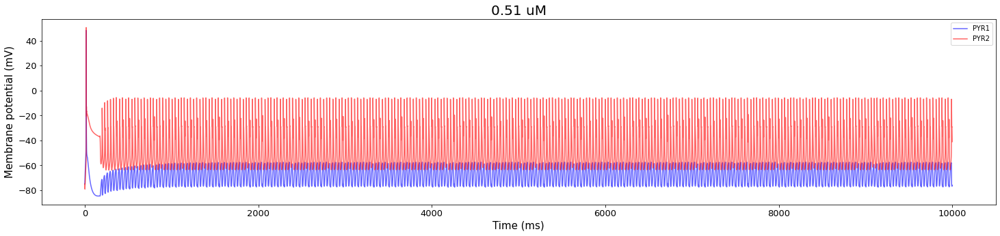

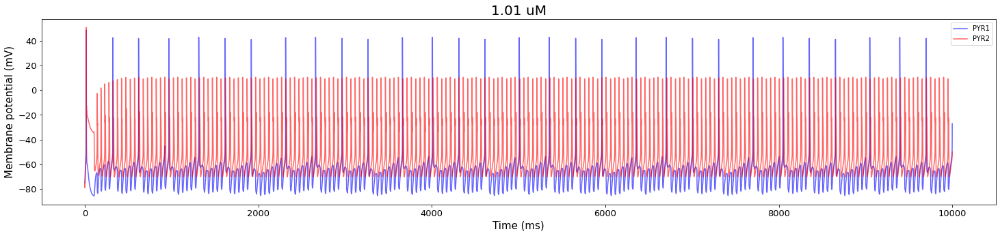

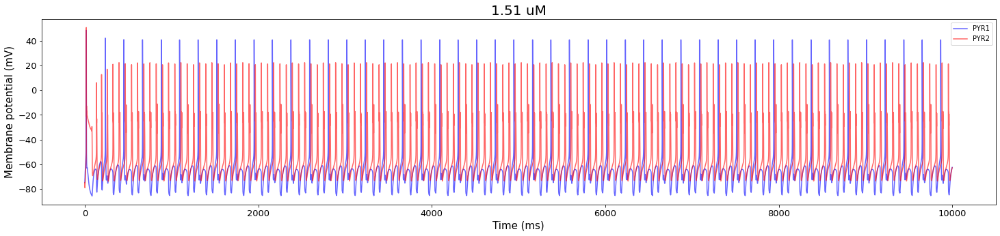

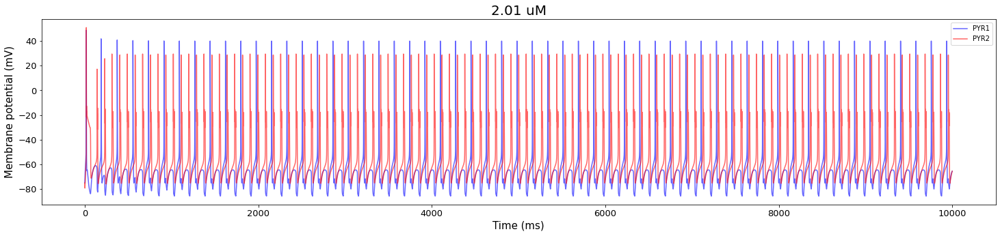

In [32]:
for atp in nostim_traces_atp.keys():
    fig, ax = plt.subplots(figsize=(25, 5))
    ode, traj, pts = nostim_traces_atp[atp]
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR1')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='PYR2')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} uM'.format(atp), fontsize=20)
    plt.savefig('Results/motif2_atp{}_traces_nostim.pdf'.format(atp))

## Stimulation

In [33]:
print(acstim_traces_atp_bn.keys())
print(acstim_traces_atp_bn[0.51].keys())
print(acstim_traces_atp_bn[1.01].keys())
print(acstim_traces_atp_bn[1.51].keys())
print(acstim_traces_atp_bn[2.01].keys())
print('--------------------------------------------------------------')
print(acstim_traces_atp_inh.keys())
print(acstim_traces_atp_inh[0.51].keys())
print(acstim_traces_atp_inh[1.01].keys())
print(acstim_traces_atp_inh[1.51].keys())
print(acstim_traces_atp_inh[2.01].keys())
print('--------------------------------------------------------------')
print(acstim_traces_atp_pyr.keys())
print(acstim_traces_atp_pyr[0.51].keys())
print(acstim_traces_atp_pyr[1.01].keys())
print(acstim_traces_atp_pyr[1.51].keys())
print(acstim_traces_atp_pyr[2.01].keys())
print('--------------------------------------------------------------')
print(dbsstim_traces_atp_bn.keys())
print(dbsstim_traces_atp_bn[0.51].keys())
print(dbsstim_traces_atp_bn[1.01].keys())
print(dbsstim_traces_atp_bn[1.51].keys())
print(dbsstim_traces_atp_bn[2.01].keys())
print('--------------------------------------------------------------')
print(dbsstim_traces_atp_inh.keys())
print(dbsstim_traces_atp_inh[0.51].keys())
print(dbsstim_traces_atp_inh[1.01].keys())
print(dbsstim_traces_atp_inh[1.51].keys())
print(dbsstim_traces_atp_inh[2.01].keys())
print('--------------------------------------------------------------')
print(dbsstim_traces_atp_pyr.keys())
print(dbsstim_traces_atp_pyr[0.51].keys())
print(dbsstim_traces_atp_pyr[1.01].keys())
print(dbsstim_traces_atp_pyr[1.51].keys())
print(dbsstim_traces_atp_pyr[2.01].keys())
print('--------------------------------------------------------------')

dict_keys([0.51, 1.01, 1.51, 2.01])
dict_keys([])
dict_keys([(2, 3.5), (25, 2.5), (30, 2.5)])
dict_keys([(2, 3.5)])
dict_keys([(30, 3.5), (50, 3.5)])
--------------------------------------------------------------
dict_keys([1.51, 0.51, 1.01, 2.01])
dict_keys([(25, 2.5), (20, 2.5)])
dict_keys([(15, 2.5), (30, 2.5)])
dict_keys([])
dict_keys([(50, 3.5)])
--------------------------------------------------------------
dict_keys([1.01, 1.51, 2.01, 0.51])
dict_keys([(20, 2.5)])
dict_keys([])
dict_keys([])
dict_keys([])
--------------------------------------------------------------
dict_keys([1.01, 0.51, 1.51, 2.01])
dict_keys([(120, 8.5)])
dict_keys([])
dict_keys([(50, 2.5)])
dict_keys([(60, 8.5)])
--------------------------------------------------------------
dict_keys([0.51, 1.01, 1.51, 2.01])
dict_keys([(120, 8.5)])
dict_keys([(75, 2.5), (100, 3.5)])
dict_keys([(60, 2.5)])
dict_keys([(60, 8.5)])
--------------------------------------------------------------
dict_keys([1.01, 1.51, 2.01, 0.5

### AC stim BN @ 1.01 $\mu M$

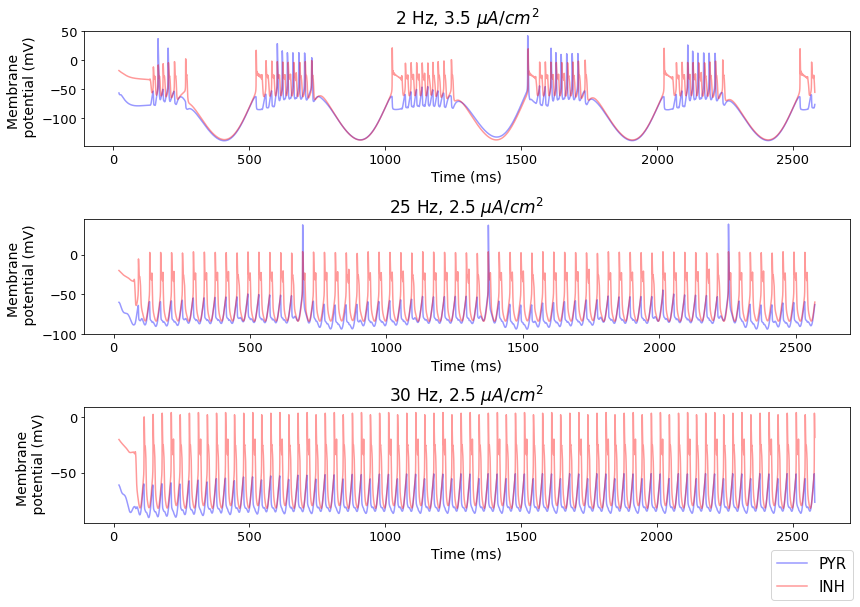

In [34]:
upper_limit = [24000, 31000,34000]
fig, axes = plt.subplots(3,1, figsize=(12, 8))
acstim_vals = [(key, val) for key, val in acstim_traces_atp_bn[1.01].items()]
for stim, ul, ax in zip(acstim_vals, upper_limit, axes):
    ode, traj, pts = stim[1]
    ax.plot(pts['t'][500:ul], pts['Vs'][500:ul], color='blue', alpha = 0.4, label = 'PYR')
    ax.plot(pts['t'][500:ul], pts['Vpost'][500:ul], color = 'red', alpha=0.4, label='INH')
    
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane \n potential (mV)', fontsize=14)
    ax.set_xlabel('Time (ms)', fontsize=14)
    ax.set_title('{} Hz, {} $\mu A/cm^2$'.format(stim[0][0], stim[0][1]), fontsize=17)
    
plt.tight_layout()
for ax in axes.flat:
    h, l = ax.get_legend_handles_labels()
fig.legend(h,l, bbox_to_anchor=(1.0, 0.05), fontsize=15)
plt.savefig('Results/motif2_atp_traces_appendix_acstim_stim_analysis_plots_bn1.01.pdf',  bbox_inches='tight')
plt.savefig('Results/motif2_atp_traces_appendix_acstim_stim_analysis_plots_bn1.01.png',  bbox_inches='tight')


(2, 3.5)
(25, 2.5)
(30, 2.5)


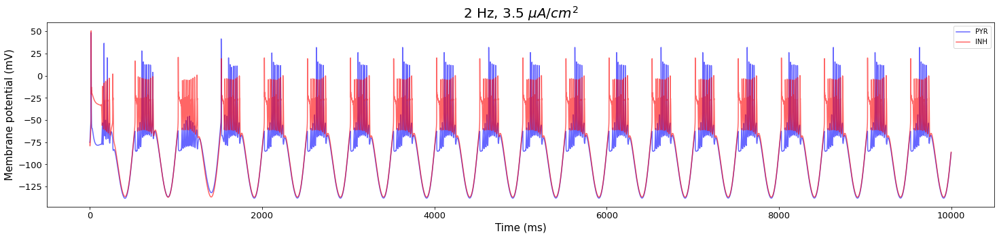

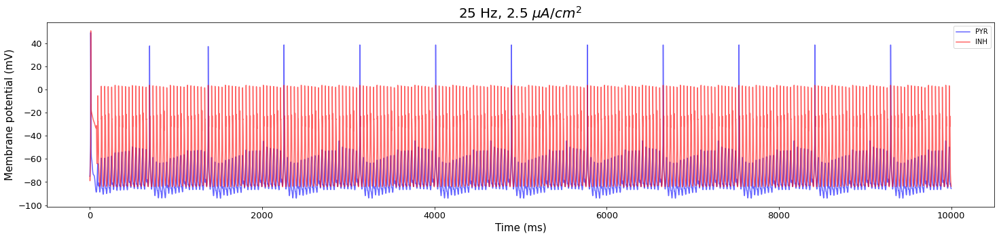

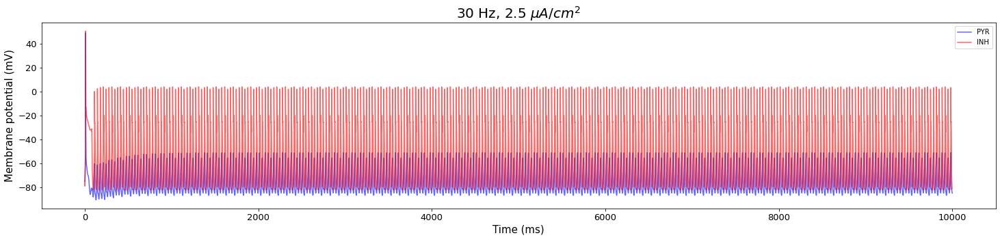

In [35]:
for key, val in acstim_traces_atp_bn[1.01].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp1.01_traces_bn_acstim{}_{}.pdf'.format(key[0], key[1]))

### AC stim BN @ 1.51 $uM$

(2, 3.5)


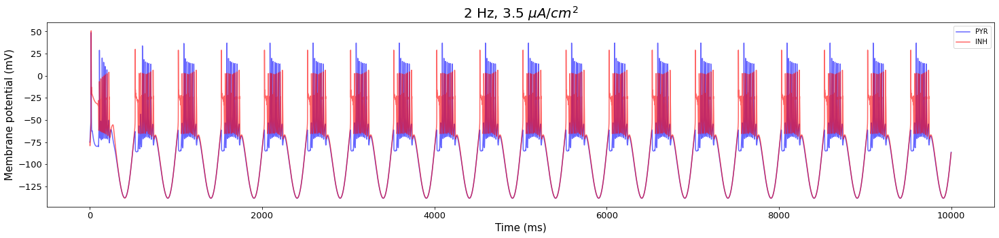

In [36]:
for key, val in acstim_traces_atp_bn[1.51].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp1.51_traces_bn_acstim{}_{}.pdf'.format(key[0], key[1]))

### AC stim BN = 2.01 uM

(30, 3.5)
(50, 3.5)


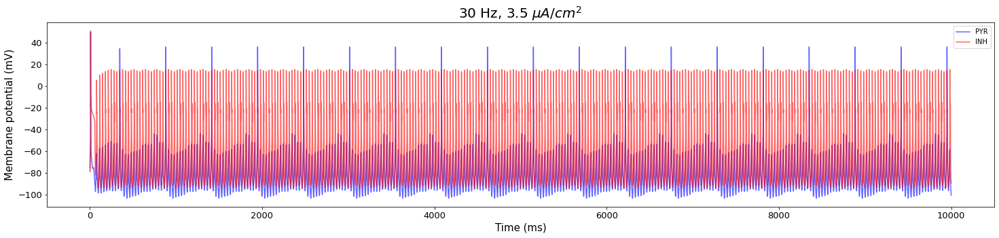

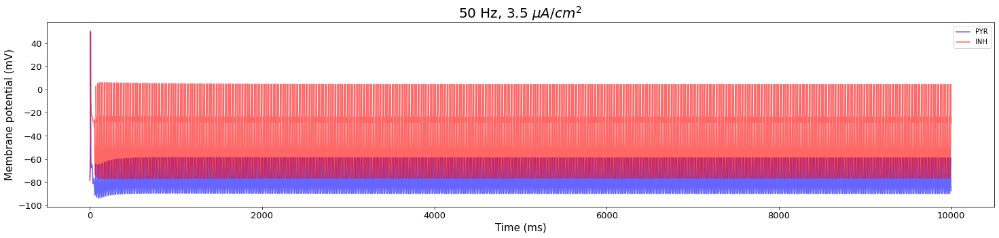

In [37]:
for key, val in acstim_traces_atp_bn[2.01].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp2.01_traces_bn_acstim{}_{}.pdf'.format(key[0], key[1]))

### AC stim INH = 0.51 uM

(25, 2.5)
(20, 2.5)


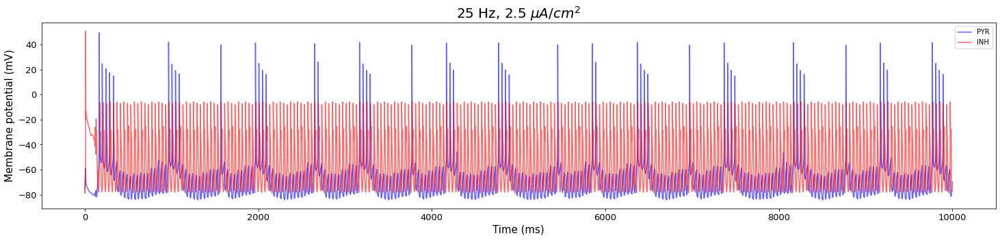

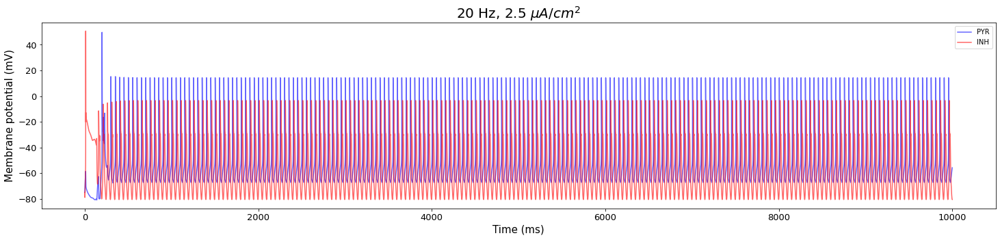

In [38]:
for key, val in acstim_traces_atp_inh[0.51].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp0.51_traces_inh_acstim{}_{}.pdf'.format(key[0], key[1]))

### AC stim INH @ 1.01 uM

(15, 2.5)
(30, 2.5)


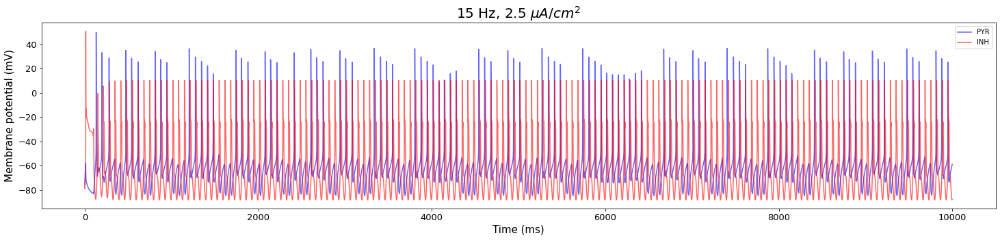

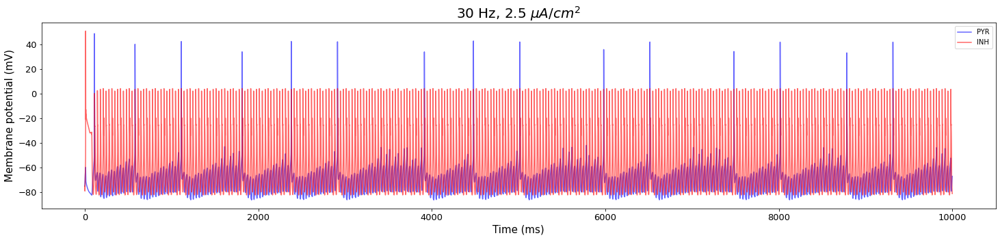

In [39]:
for key, val in acstim_traces_atp_inh[1.01].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp1.01_traces_inh_acstim{}_{}.pdf'.format(key[0], key[1]))

### AC stim INH @ 2.01 uM

(50, 3.5)


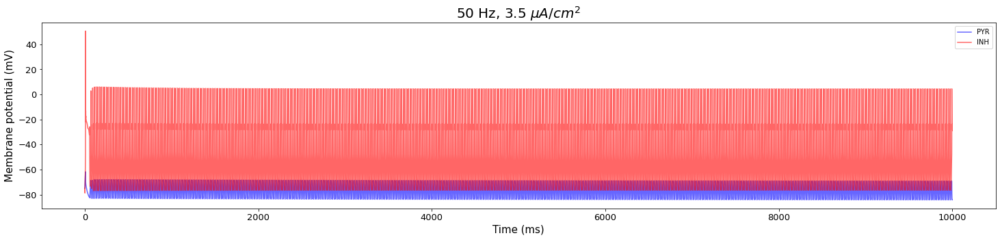

In [40]:
for key, val in acstim_traces_atp_inh[2.01].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp2.01_traces_inh_acstim{}_{}.pdf'.format(key[0], key[1]))

### AC stim PYR @ 0.51uM

(20, 2.5)


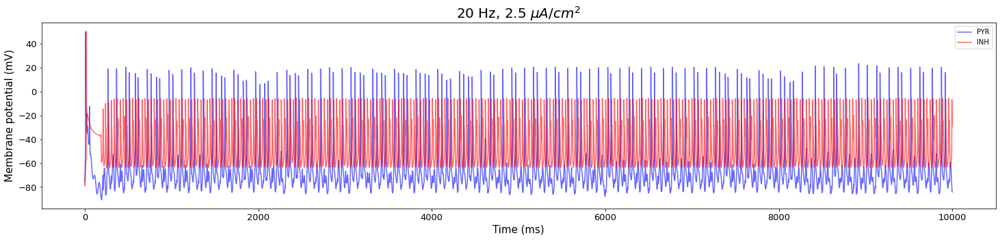

In [41]:
for key, val in acstim_traces_atp_pyr[0.51].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp0.51_traces_pyr_acstim{}_{}.pdf'.format(key[0], key[1]))

### DBS stim BN @ 0.51uM

(120, 8.5)


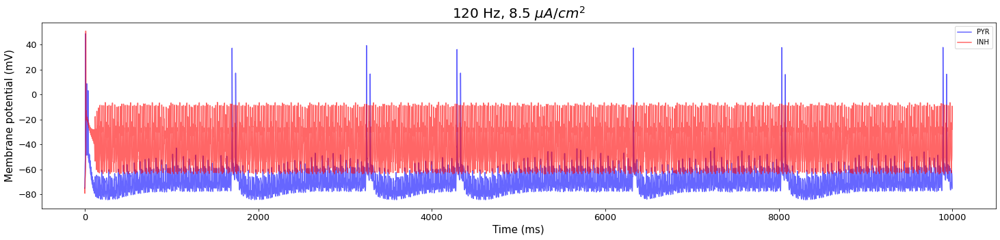

In [42]:
for key, val in dbsstim_traces_atp_bn[0.51].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp0.51_traces_bn_dbsstim{}_{}.pdf'.format(key[0], key[1]))

### DBS stim BN @ 1.51 uM

(50, 2.5)


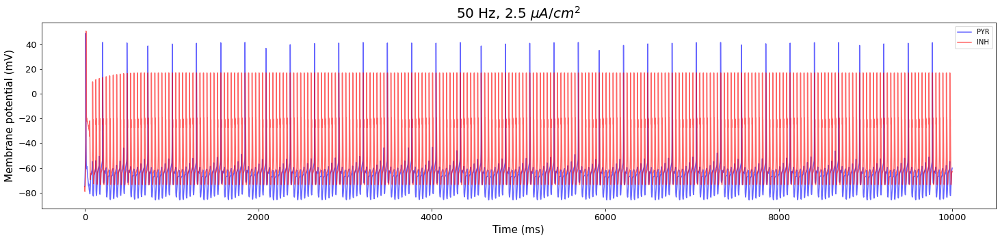

In [43]:
for key, val in dbsstim_traces_atp_bn[1.51].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp1.51_traces_bn_dbsstim{}_{}.pdf'.format(key[0], key[1]))

### DBS stim BN @ 2.01 uM

(60, 8.5)


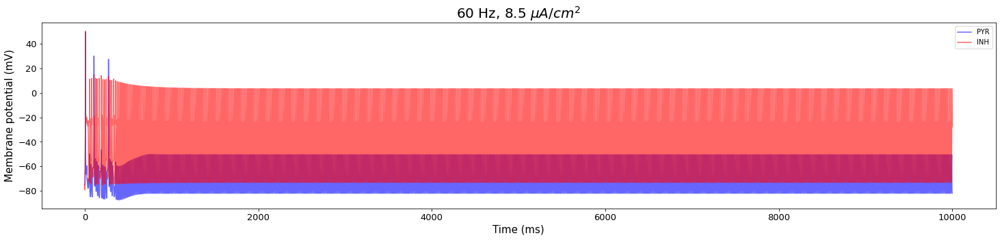

In [44]:
for key, val in dbsstim_traces_atp_bn[2.01].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp2.01_traces_bn_dbsstim{}_{}.pdf'.format(key[0], key[1]))

### DBS stim INH @ 0.51 uM

(120, 8.5)


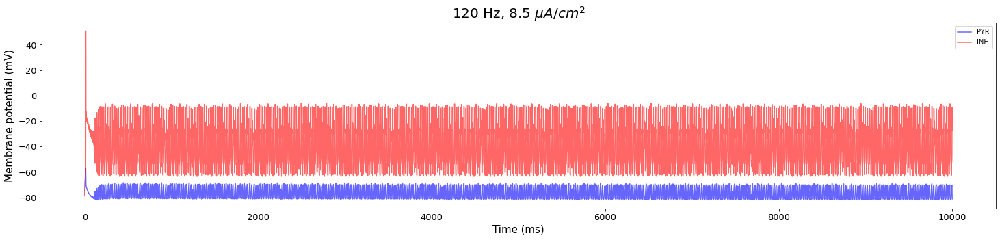

In [45]:
for key, val in dbsstim_traces_atp_inh[0.51].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp0.51_traces_inh_dbsstim{}_{}.pdf'.format(key[0], key[1]))

### DBS stim INH @ 1.01 uM

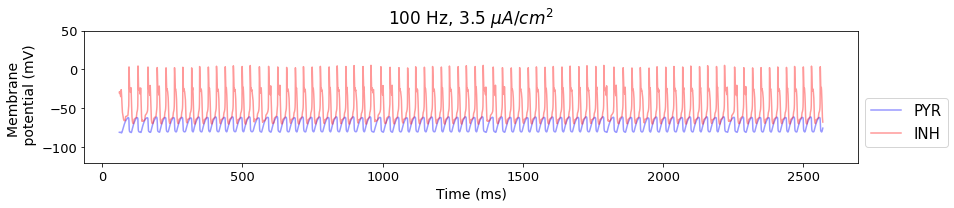

In [46]:
upper_limit = [45000]
fig, ax = plt.subplots(1,1, figsize=(12, 3))
acstim_vals = [(key, val) for key, val in dbsstim_traces_atp_inh[1.01].items() if key == (100, 3.5)]
for stim, ul in zip(acstim_vals, upper_limit):
    _,x_, pts = stim[1]
    ax.plot(pts['t'][1000:ul], pts['Vs'][1000:ul], color='blue', alpha = 0.4, label = 'PYR')
    ax.plot(pts['t'][1000:ul], pts['Vpost'][1000:ul], color = 'red', alpha=0.4, label='INH')
    
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane \n potential (mV)', fontsize=14)
    ax.set_xlabel('Time (ms)', fontsize=14)
    ax.set_title('{} Hz, {} $\mu A/cm^2$'.format(stim[0][0], stim[0][1]), fontsize=17)
    
plt.tight_layout()
#for ax in axes.flat:
    #h, l = ax.get_legend_handles_labels()
#fig.legend(h,l, bbox_to_anchor=(1.0, 0.05), fontsize=15)
plt.legend(bbox_to_anchor=(1.0, 0.55), fontsize=15)
plt.ylim(-120,50)
plt.savefig('Results/motif2_atp_traces_appendix_dbsstim_stim_analysis_plots_inh1.01.pdf',  bbox_inches='tight')
plt.savefig('Results/motif2_atp_traces_appendix_dbsstim_stim_analysis_plots_inh1.01.png',  bbox_inches='tight')


(75, 2.5)
(100, 3.5)


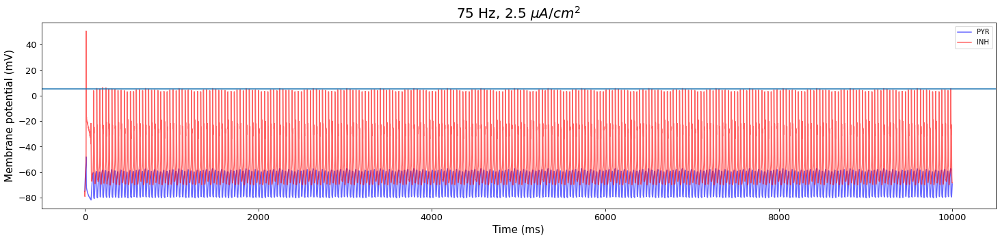

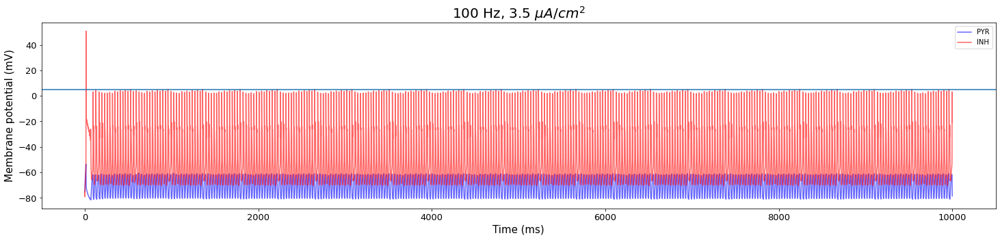

In [47]:
for key, val in dbsstim_traces_atp_inh[1.01].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp1.01_traces_inh_dbsstim{}_{}.pdf'.format(key[0], key[1]))
    plt.axhline(y=5)

### DBS stim INH @ 1.51 uM

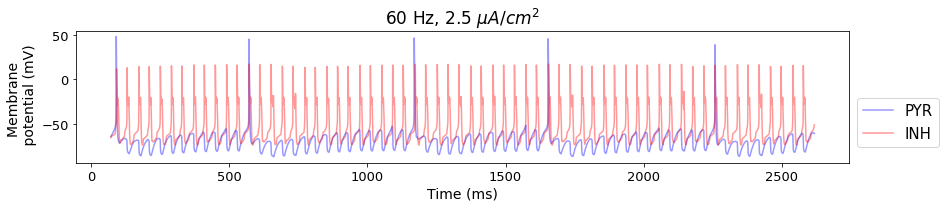

In [48]:
upper_limit = [39000]
fig, ax = plt.subplots(1,1, figsize=(12, 3))
acstim_vals = [(key, val) for key, val in dbsstim_traces_atp_inh[1.51].items() if key == (60, 2.5)]
for stim, ul in zip(acstim_vals, upper_limit):
    _,x_, pts = stim[1]
    ax.plot(pts['t'][1000:ul], pts['Vs'][1000:ul], color='blue', alpha = 0.4, label = 'PYR')
    ax.plot(pts['t'][1000:ul], pts['Vpost'][1000:ul], color = 'red', alpha=0.4, label='INH')
    
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane \n potential (mV)', fontsize=14)
    ax.set_xlabel('Time (ms)', fontsize=14)
    ax.set_title('{} Hz, {} $\mu A/cm^2$'.format(stim[0][0], stim[0][1]), fontsize=17)
    
plt.tight_layout()
plt.legend(bbox_to_anchor=(1.0, 0.55), fontsize=15)

plt.savefig('Results/motif2_atp_traces_appendix_dbsstim_stim_analysis_plots_inh1.51.pdf',  bbox_inches='tight')
plt.savefig('Results/motif2_atp_traces_appendix_dbsstim_stim_analysis_plots_inh1.51.png',  bbox_inches='tight')


(60, 2.5)


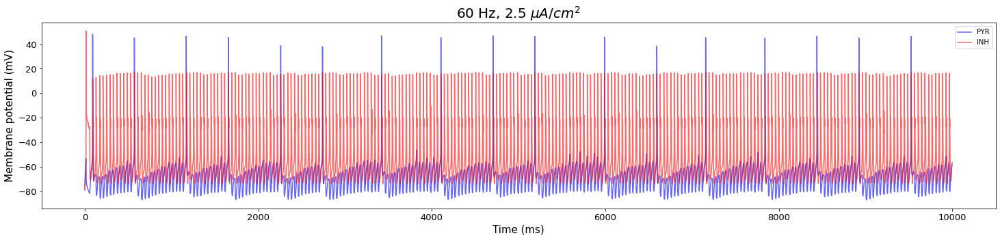

In [49]:
for key, val in dbsstim_traces_atp_inh[1.51].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp1.51_traces_inh_dbsstim{}_{}.pdf'.format(key[0], key[1]))

### DBS stim INH @ 2.01 uM

(60, 8.5)


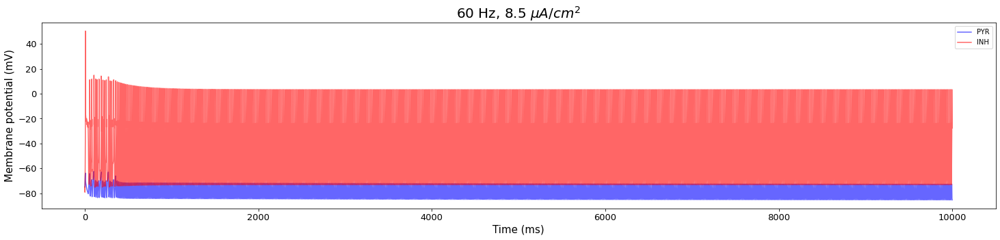

In [50]:
for key, val in dbsstim_traces_atp_inh[2.01].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp2.01_traces_inh_dbsstim{}_{}.pdf'.format(key[0], key[1]))

### DBS stim PYR @ 0.51 uM

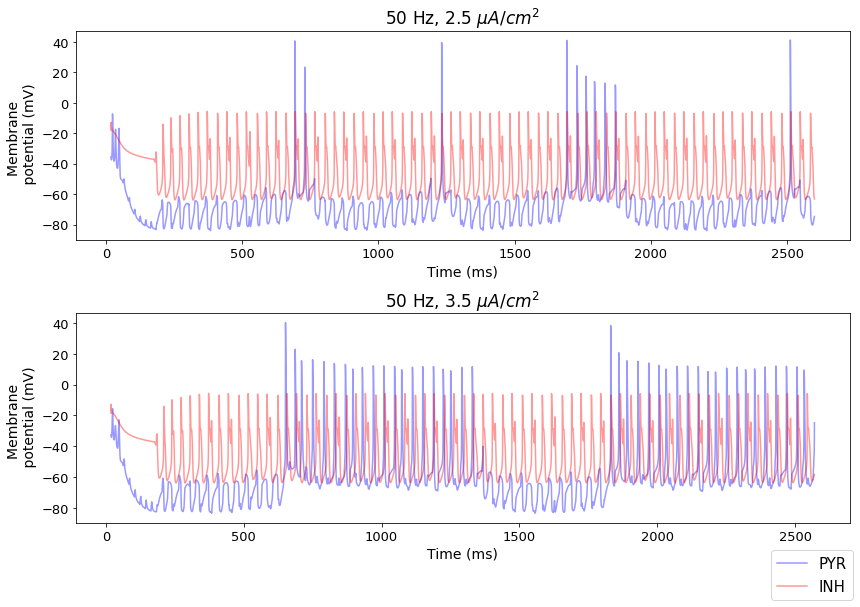

In [51]:
upper_limit = [34000, 39000]
fig, axes = plt.subplots(2,1, figsize=(12, 8))
acstim_vals = [(key, val) for key, val in dbsstim_traces_atp_pyr[0.51].items()]
for stim, ul, ax in zip(acstim_vals, upper_limit, axes):
    ode, traj, pts = stim[1]
    ax.plot(pts['t'][500:ul], pts['Vs'][500:ul], color='blue', alpha = 0.4, label = 'PYR')
    ax.plot(pts['t'][500:ul], pts['Vpost'][500:ul], color = 'red', alpha=0.4, label='INH')
    
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane \n potential (mV)', fontsize=14)
    ax.set_xlabel('Time (ms)', fontsize=14)
    ax.set_title('{} Hz, {} $\mu A/cm^2$'.format(stim[0][0], stim[0][1]), fontsize=17)
    
plt.tight_layout()
for ax in axes.flat:
    h, l = ax.get_legend_handles_labels()
fig.legend(h,l, bbox_to_anchor=(1.0, 0.05), fontsize=15)
plt.savefig('Results/motif2_atp_traces_appendix_acstim_stim_analysis_plots_pyr1.01.pdf',  bbox_inches='tight')
plt.savefig('Results/motif2_atp_traces_appendix_acstim_stim_analysis_plots_pyr1.01.png',  bbox_inches='tight')


(50, 2.5)
(50, 3.5)


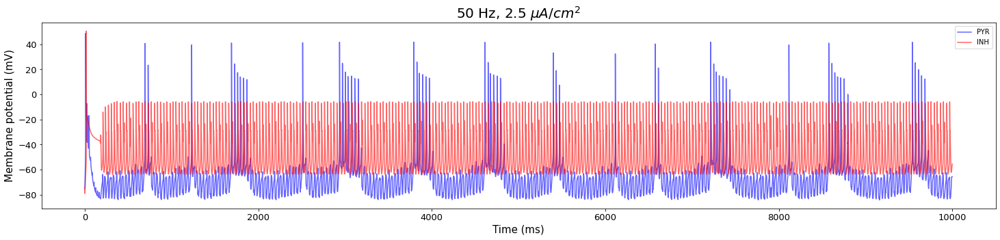

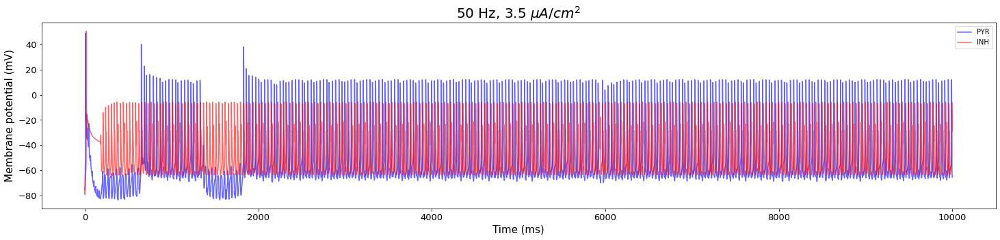

In [52]:
for key, val in dbsstim_traces_atp_pyr[0.51].items():
    fig, ax = plt.subplots(figsize=(25, 5))
    print(key)
    ode, traj, pts = val
    ax.plot(pts['t'], pts['Vs'], color='blue', alpha = 0.6, label = 'PYR')
    ax.plot(pts['t'], pts['Vpost'], color = 'red', alpha=0.6, label='INH')
    ax.legend(loc='best')
    ax.tick_params(which='both', labelsize=13)
    ax.set_ylabel('Membrane potential (mV)', fontsize=15)
    ax.set_xlabel('Time (ms)', fontsize=15)
    plt.title('{} Hz, {} '.format(key[0], key[1]) + '$\mu A/cm^2$', fontsize=20)
    plt.savefig('Results/motif2_atp0.51_traces_pyr_dbsstim{}_{}.pdf'.format(key[0], key[1]))